In [1]:
## Setup environment

In [2]:
import matplotlib 
%matplotlib inline

## Setup imports

In [3]:
## Setup imports

In [4]:
# 필요한 모듈들을 임포트
import os  # 운영 체제와 상호 작용하기 위한 모듈
import shutil  # 파일 및 디렉토리 작업을 위한 모듈
import tempfile  # 임시 파일 및 디렉토리를 만드는 데 사용되는 모듈
import matplotlib.pyplot as plt  # 데이터 시각화를 위한 라이브러리
from tqdm import tqdm  # 프로그레스 바를 만들기 위한 라이브러리


# MONAI에서 제공하는 손실함수와 추론 메서드 임포트
from monai.losses import DiceCELoss  # Dice + Cross Entropy 손실 함수
from monai.inferers import sliding_window_inference  # 슬라이딩 윈도우 방식으로 이미지 추론


# 데이터 변환에 필요한 클래스 임포트
from monai.transforms import (
    AsDiscrete,  # 데이터를 이산 형태로 변환
    EnsureChannelFirstd,  # 데이터의 첫 번째 차원이 채널이 되도록 보장
    Compose,  # 여러 변환을 한 번에 적용
    CropForegroundd,  # 배경을 제거하고 전경만 남김
    LoadImaged,  # 이미지 데이터 로드
    Orientationd,  # 이미지의 방향을 조정
    RandFlipd,  # 이미지를 무작위로 뒤집음
    RandCropByPosNegLabeld,  # 레이블에 따라 이미지를 무작위로 자름
    RandShiftIntensityd,  # 이미지의 강도를 무작위로 이동
    ScaleIntensityRanged,  # 이미지의 강도를 특정 범위로 조정
    Spacingd,  # 이미지의 공간 해상도 조정
    RandRotate90d,  # 이미지를 90도씩 무작위로 회전
)


# MONAI 구성 및 성능 지표 클래스 임포트
from monai.config import print_config  # MONAI의 구성을 출력
from monai.metrics import DiceMetric  # Dice 지표를 계산


# MONAI에서 제공하는 UNETR 네트워크 모델 임포트
from monai.networks.nets import UNETR  # UNETR 네트워크 모델

# 데이터 로딩 및 캐싱에 필요한 클래스 임포트
from monai.data import (
    DataLoader,  # 데이터 로더
    CacheDataset,  # 캐시 데이터셋
    load_decathlon_datalist,  # 디카프론 데이터 리스트 로드
    decollate_batch,  # 배치 분리
)

# 파이토치 임포트
import torch

# MONAI 구성 출력
print_config()

/home/hyoreek/.local/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


MONAI version: 0.8.1
Numpy version: 1.19.5
Pytorch version: 1.10.2+cu102
MONAI flags: HAS_EXT = False, USE_COMPILED = False
MONAI rev id: 71ff399a3ea07aef667b23653620a290364095b1

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: 3.2.2
scikit-image version: 0.17.2
Pillow version: 8.4.0
Tensorboard version: NOT INSTALLED or UNKNOWN VERSION.
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: 0.11.2+cu102
tqdm version: 4.64.1
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: NOT INSTALLED or UNKNOWN VERSION.
pandas version: NOT INSTALLED or UNKNOWN VERSION.
einops version: 0.4.1
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



In [5]:
from monai.transforms import Transform

class ReverseHorizontal(Transform):
    def __init__(self, keys):
        self.keys = keys

    def __call__(self, data):
        for key in self.keys:
            data[key] = np.flip(data[key], axis=2).copy()  # axis=2를 사용하여 가로 방향으로 이미지를 반전하고, 복사본을 만듭니다.
        return data


In [6]:
# 훈련 데이터에 적용될 변환들을 정의합니다.
train_transforms_no_label = Compose(
    [
        # 이미지를 메모리로 로드합니다.
        LoadImaged(keys=["image"]),
        # 이미지의 채널 축을 (C, H, W, D)에서 (H, W, D, C)로 변경합니다.
        EnsureChannelFirstd(keys=["image"]),
        # 이미지의 방향을 RAS (Right-Anterior-Superior) 기준으로 조정합니다.
        Orientationd(keys=["image"], axcodes="RAS"),
        # 이미지의 픽셀 간격을 지정된 값으로 조정합니다. 이미지는 bilinear 보간법으로 처리됩니다.
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 2.0), mode="bilinear"),
        # 이미지의 강도를 범위로 스케일링합니다. 원래 범위인 [-175, 250]을 [0, 1]로 변환합니다.
        ScaleIntensityRanged(keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True),
        # foreground (물체가 있는 부분)를 기반으로 이미지를 잘라냅니다.
        CropForegroundd(keys=["image"], source_key="image"),
        # 랜덤으로 축을 따라 이미지를 뒤집습니다. 각각의 축마다 10%의 확률로 뒤집습니다.
        RandFlipd(keys=["image"], spatial_axis=[0], prob=0.10),
        RandFlipd(keys=["image"], spatial_axis=[1], prob=0.10),
        RandFlipd(keys=["image"], spatial_axis=[2], prob=0.10),
        # 랜덤으로 이미지를 90도 회전합니다. 최대 3번 회전하며, 각 회전에는 10%의 확률이 적용됩니다.
        RandRotate90d(keys=["image"], prob=0.10, max_k=3),
        # 이미지 강도를 랜덤으로 변화시킵니다. 각각의 픽셀에 대해 50%의 확률로 최대 10%까지 값을 변화시킵니다.
        RandShiftIntensityd(keys=["image"], offsets=0.10, prob=0.50),
        ReverseHorizontal(keys=["image"]),
        
    ]
)

# 검증 데이터에 적용될 변환들을 정의합니다.
val_transforms_no_label = Compose(
    [
        # 이미지를 메모리로 로드합니다.
        LoadImaged(keys=["image"]),
        # 이미지의 채널 축을 (C, H, W, D)에서 (H, W, D, C)로 변경합니다.
        EnsureChannelFirstd(keys=["image"]),
        # 이미지의 방향을 RAS (Right-Anterior-Superior) 기준으로 조정합니다.
        Orientationd(keys=["image"], axcodes="RAS"),
        # 이미지의 픽셀 간격을 지정된 값으로 조정합니다. 이미지는 bilinear 보간법으로 처리됩니다.
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 2.0), mode="bilinear"),
        # 이미지의 강도를 범위로 스케일링합니다. 원래 범위인 [-175, 250]을 [0, 1]로 변환합니다.
        ScaleIntensityRanged(keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True),
        # foreground (물체가 있는 부분)를 기반으로 이미지를 잘라냅니다.
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)


### Create Model, Loss, Optimizer


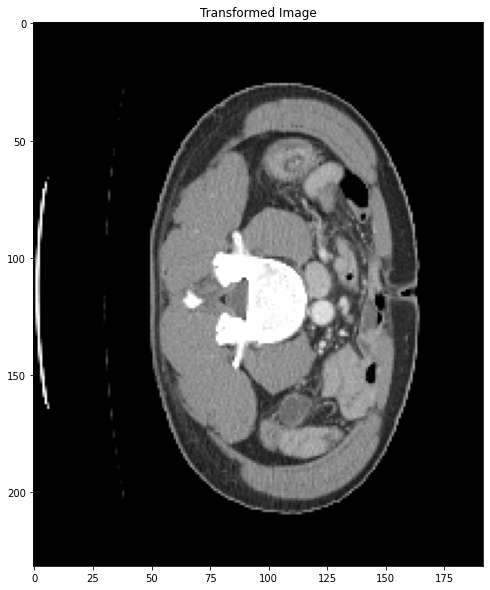

Pixel intensity range: 0.0 - 1.0


In [7]:
# 필요한 라이브러리를 가져옵니다.
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
from monai.networks.nets import UNETR
from monai.losses import DiceCELoss
from monai.transforms import Transform


import torch
import torch.nn as nn
from monai.transforms import LoadImaged, AddChanneld, ScaleIntensityd, RandGaussianNoised, ToTensord
from monai.data import PersistentDataset, DataLoader
from monai.utils import set_determinism

# 재현성을 위해 랜덤 시드를 설정합니다.
set_determinism(seed=0)

# CUDA 설정을 합니다. 이 설정은 GPU를 사용할 때, 어떤 GPU를 사용할지 정하는 데 사용됩니다.
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
#다중GPU쓸 땐 번호 추가
os.environ["CUDA_VISIBLE_DEVICES"] = "0"


# 사용 가능한 경우 CUDA(GPU), 그렇지 않은 경우 CPU를 사용하도록 설정합니다.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



model = UNETR(
    in_channels=1,
    out_channels=14,
    img_size=(96, 96, 96),
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)


# GPU다중사용
# 여러 GPU가 사용 가능한 경우 DataParallel을 사용
# if torch.cuda.device_count() > 1:
#     print("Using", torch.cuda.device_count(), "GPUs!")
#     model = nn.DataParallel(model)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

# 데이터가 저장된 디렉토리를 설정합니다.
data_dir = "../../dataset/hyoreek/HCC/"

# 주어진 디렉토리에서 모든 nii.gz 파일을 찾아 리스트로 만듭니다.
file_list = glob.glob(data_dir + '*_por_.nii.gz')

# 각 파일 이름에 대한 데이터 리스트를 생성합니다. 
datalist = [{'image': filename} for filename in file_list]  

# 데이터셋과 데이터 로더를 생성합니다.
# CacheDataset은 데이터를 메모리에 캐시하여 더 빠른 데이터 로딩을 가능하게 합니다.
# DataLoader는 멀티스레딩을 사용하여 배치 데이터를 효율적으로 로드합니다.
dataset = PersistentDataset(data=datalist, transform=train_transforms_no_label, cache_dir="./persistent_cache")
loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=8, pin_memory=True)

# 첫 번째 배치에서 이미지를 가져옵니다.
image_dict = next(iter(loader))

# 변환된 이미지를 표시합니다.
image = image_dict['image']
plt.figure(figsize=(10, 10))
plt.imshow(image[0, 0, :, :, image.shape[4] // 2].cpu().numpy(), cmap='gray')
plt.title('Transformed Image')
plt.show()

print(f"Pixel intensity range: {image.min()} - {image.max()}")

In [8]:
### HCC Dataset Visualization for Aorta Segmentation

Image shape: torch.Size([1, 1, 238, 185, 140])
Output shape: torch.Size([1, 14, 238, 185, 140])


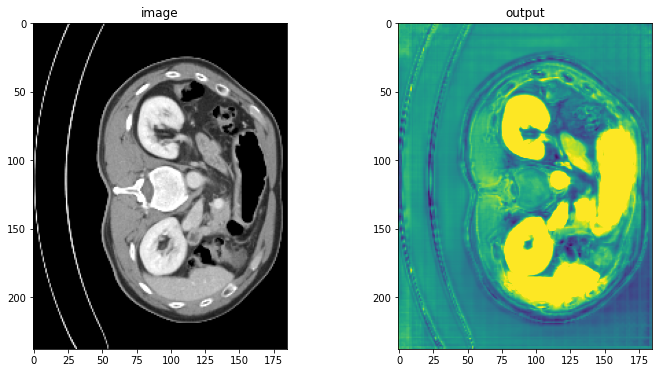

In [9]:
# 저장된 모델 가중치 불러오기
model_path = '/home/hyoreek/best_metric_model.pth'  # 모델 가중치 파일 경로
checkpoint = torch.load(model_path, map_location=device)

# 모델의 state_dict를 불러오기 전에 DataParallel을 제거합니다.
if isinstance(model, torch.nn.DataParallel):
    model = model.module

# 직접 모델 가중치를 불러옵니다.
model.load_state_dict(checkpoint, strict=False)

# 모델을 평가 모드로 설정
model.eval()

# 레이블이 없는 새로운 데이터셋에 대해 예측 수행
with torch.no_grad():
    for i, data in enumerate(loader):
        # print(i, data)
        image = data['image'].to(device)  # 'image' 변수를 사용하도록 변경했습니다.
        output = sliding_window_inference(image, (96, 96, 96), 1, model, overlap=0.9)


        print("Image shape:", image.shape)
        print("Output shape:", output.shape)  # Output의 shape을 출력합니다 [1, 14, 512, 512, 46]

        outputplt = output[0, 0, :, :,output.shape[4] // 2].cpu().numpy()
        outputplt = ((outputplt-8)**2)**(1/2)
        # 이미지와 모델 출력 시각화
        plt.figure("check", (12, 6))
        plt.subplot(1, 2, 1)
        plt.title("image")
        plt.imshow(image[0, 0, :, :, image.shape[4] // 2].cpu().numpy(), cmap="gray")  # 강도조절을 적용한 이미지를 시각화
        plt.subplot(1, 2, 2)
        plt.title("output")  # 채널 1을 시각화하고 있음을 표시합니다.
        plt.imshow(outputplt, vmin=0, vmax=5)  # 첫 번째 채널을 시각화합니다.
        plt.show()
        
        # 첫 번째 이미지만 시각화하고 종료
        break


Image shape: torch.Size([1, 1, 241, 216, 121])
Output shape: torch.Size([1, 14, 241, 216, 121])


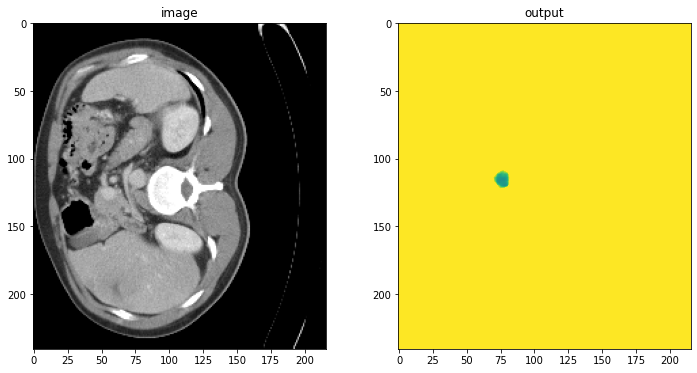

In [10]:
#대동맥만 세그멘테이션
# 저장된 모델 가중치 불러오기
model_path = '/home/hyoreek/best_metric_model.pth'  # 모델 가중치 파일 경로
checkpoint = torch.load(model_path, map_location=device)

# 모델의 state_dict를 불러오기 전에 DataParallel을 제거합니다.
if isinstance(model, torch.nn.DataParallel):
    model = model.module

# 직접 모델 가중치를 불러옵니다.
model.load_state_dict(checkpoint, strict=False)

# 모델을 평가 모드로 설정
model.eval()

# 레이블이 없는 새로운 데이터셋에 대해 예측 수행
with torch.no_grad():
    for i, data in enumerate(loader):
        # print(i, data)
        image = data['image'].to(device)  # 'image' 변수를 사용하도록 변경했습니다.
        output = sliding_window_inference(image, (96, 96, 96), 1, model, overlap=0.9)


        print("Image shape:", image.shape)
        print("Output shape:", output.shape)  # Output의 shape을 출력합니다 [1, 14, 512, 512, 46]
        ### ### ###
        outputplt = output[0, 8, :, :,output.shape[4] // 2].cpu().numpy() #### ### ### 1번 Index는 aorta
        ### ### ###
        outputplt = ((outputplt-8)**2)**(1/2)
        # 이미지와 모델 출력 시각화
        plt.figure("check", (12, 6))
        plt.subplot(1, 2, 1)
        plt.title("image")
        plt.imshow(image[0, 0, :, :, image.shape[4] // 2].cpu().numpy(), cmap="gray")  # 강도조절을 적용한 이미지를 시각화
        plt.subplot(1, 2, 2)
        plt.title("output")  # 채널 1을 시각화하고 있음을 표시합니다.
        plt.imshow(outputplt, vmin=0, vmax=5)  # 첫 번째 채널을 시각화합니다.
        plt.show()
        
        # 첫 번째 이미지만 시각화하고 종료
        break


Output shape: torch.Size([1, 1, 227, 185, 234])
Output shape: torch.Size([1, 14, 227, 185, 234])


/home/hyoreek/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in log
  after removing the cwd from sys.path.


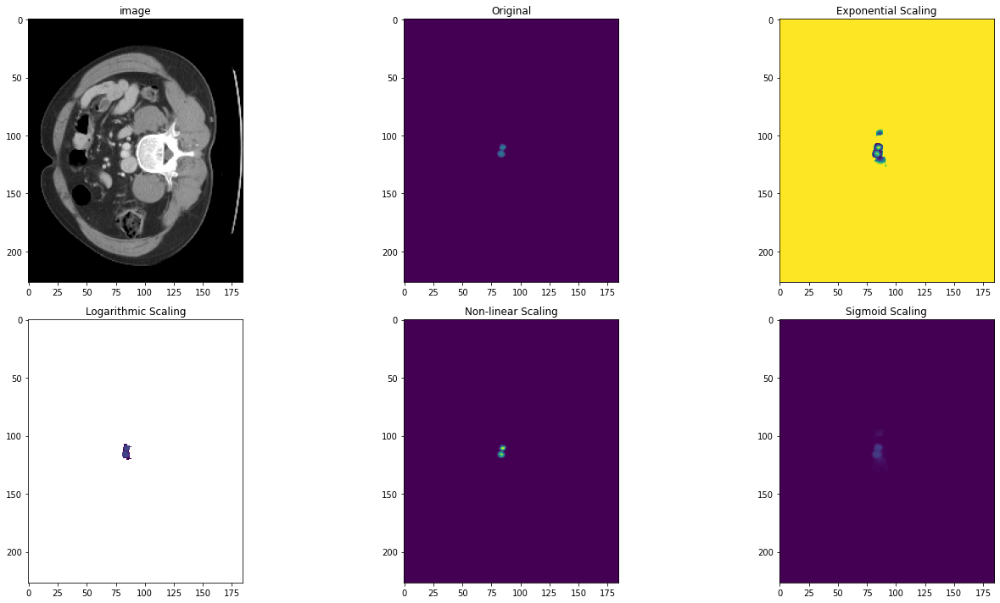

In [11]:
scaling_methods = {
    'Original': lambda x: x,
    'Exponential Scaling': lambda x: x ** 2,
    'Logarithmic Scaling': lambda x: np.log(x + 1),
    'Non-linear Scaling': lambda x: np.where(x > 0.5, x ** 2, x),
    'Sigmoid Scaling': lambda x: 1 / (1 + np.exp(-x))
}
with torch.no_grad():
    for i, data in enumerate(loader):
        image = data['image'].to(device)
        output = sliding_window_inference(image, (96, 96, 96), 2, model, overlap=0.9)

        print("Output shape:", image.shape)
        print("Output shape:", output.shape)

        base_output = output[0, 8, :, :, output.shape[4] // 2].cpu().numpy()

        plt.figure("check", figsize=(20, 10))

        # 원본 이미지 출력
        plt.subplot(2, 3, 1)
        plt.title("image")
        plt.imshow(image[0, 0, :, :, image.shape[4] // 2].cpu().numpy(), cmap="gray")

        # 각 스케일링 방법에 따른 출력
        for idx, (method_name, scaling_func) in enumerate(scaling_methods.items(), 2):
            scaled_output = scaling_func(base_output)
            plt.subplot(2, 3, idx)
            plt.title(method_name)
            plt.imshow(scaled_output, vmin=0, vmax=5)

        plt.tight_layout()
        plt.show()
        
        break


/home/hyoreek/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/hyoreek/.local/lib/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/hyoreek/.local/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/hyoreek/.local/lib/python3.6/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/hyoreek/.local/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


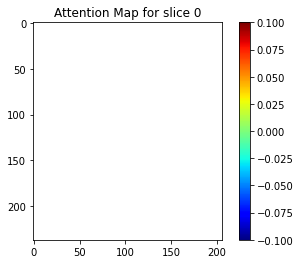

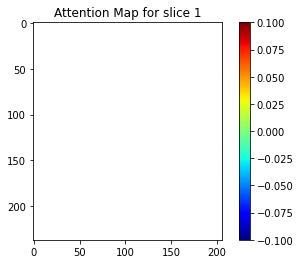

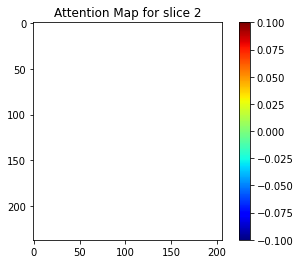

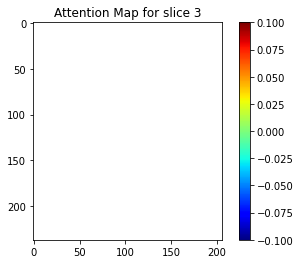

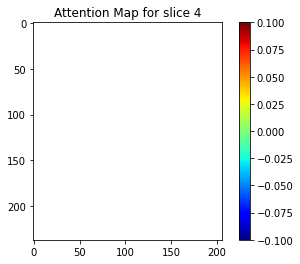

...

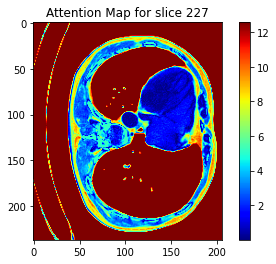

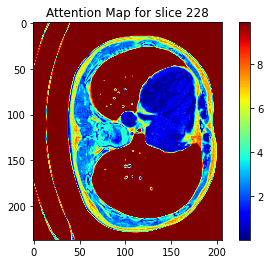

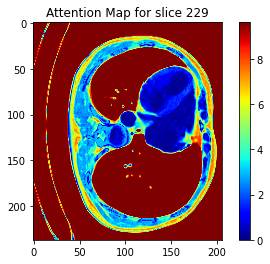

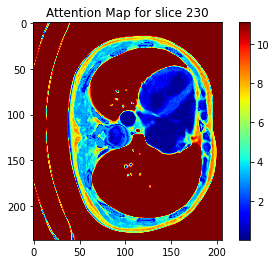

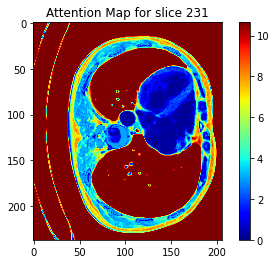

대동맥 영역의 픽셀 값들: [Data(sub_id=0, slice_id=0, aorta_repval=nan), Data(sub_id=0, slice_id=1, aorta_repval=nan), Data(sub_id=0, slice_id=2, aorta_repval=nan), Data(sub_id=0, slice_id=3, aorta_repval=nan), Data(sub_id=0, slice_id=4, aorta_repval=nan), Data(sub_id=0, slice_id=5, aorta_repval=nan), Data(sub_id=0, slice_id=6, aorta_repval=nan), Data(sub_id=0, slice_id=7, aorta_repval=nan), Data(sub_id=0, slice_id=8, aorta_repval=nan), Data(sub_id=0, slice_id=9, aorta_repval=nan), Data(sub_id=0, slice_id=10, aorta_repval=nan), Data(sub_id=0, slice_id=11, aorta_repval=nan), Data(sub_id=0, slice_id=12, aorta_repval=nan), Data(sub_id=0, slice_id=13, aorta_repval=nan), Data(sub_id=0, slice_id=14, aorta_repval=nan), Data(sub_id=0, slice_id=15, aorta_repval=nan), Data(sub_id=0, slice_id=16, aorta_repval=nan), Data(sub_id=0, slice_id=17, aorta_repval=nan), Data(sub_id=0, slice_id=18, aorta_repval=nan), Data(sub_id=0, slice_id=19, aorta_repval=nan), Data(sub_id=0, slice_id=20, aorta_repval=nan), Data(su

In [12]:
#대동맥 어텐션맵
#장호쌤의 코드를 쉽게 변형한 코드.


# 필요한 라이브러리들을 불러옵니다.
import numpy as np
import matplotlib.pyplot as plt
import torch

# 대표값을 저장하기 위한 간단한 클래스를 정의합니다.
class Data:
    # 생성자: 객체를 초기화합니다.
    def __init__(self, sub_id, slice_id, aorta_repval):
        self.sub_id = sub_id
        self.slice_id = slice_id
        self.aorta_repval = aorta_repval
    
    # 객체의 문자열 표현을 반환하는 메서드입니다. 이를 통해 print 시 보기 좋게 출력됩니다.
    def __repr__(self):
        return f"Data(sub_id={self.sub_id}, slice_id={self.slice_id}, aorta_repval={self.aorta_repval:.8f})"

# 대동맥 영역의 픽셀 값을 저장하기 위한 리스트를 초기화합니다.
aorta_rep_values = []

# 모델 평가를 위해 gradient 계산을 중지합니다. 이를 통해 메모리 사용량을 줄이고 계산 속도를 향상시킵니다.
with torch.no_grad():
    # loader에서 데이터를 하나씩 가져와 처리합니다.
    for i, data in enumerate(loader):
        # 입력 이미지를 GPU나 CPU로 이동합니다.
        image = data['image'].to(device)
        # 슬라이딩 윈도우를 사용하여 이미지에 대한 모델의 예측값을 얻습니다.
        output = sliding_window_inference(image, (96, 96, 96), 2, model, overlap=0.9)
        # 예측값 중 대동맥 클래스(클래스 번호 8)에 해당하는 영역만을 True로 마스크를 생성합니다.
        aorta_segmentation = (output.argmax(dim=1) == 8).cpu().numpy()

        # 원본 이미지를 가져옵니다.
        original_image = image[0, 0, :, :, :].cpu().numpy()

        # 각 슬라이스 별로 처리를 진행합니다.
        for idx in range(original_image.shape[-1]):
            # 현재 슬라이스 이미지를 가져옵니다.
            slide = original_image[:, :, idx]
            # 현재 슬라이스에 해당하는 세그멘테이션 정보를 가져옵니다.
            seg_slide = aorta_segmentation[0, :, :, idx]
            # 세그멘테이션 내의 픽셀 값을 추출합니다.
            aorta_pixels = slide[seg_slide]
            
            # 대동맥 영역의 중앙값을 계산합니다.
            median_val = np.median(aorta_pixels)
            
            # 어텐션 맵을 계산합니다.
            attention_map = np.abs(slide - median_val) / np.std(aorta_pixels)

            # 어텐션 맵을 시각화합니다.
            plt.imshow(attention_map, cmap='jet')
            plt.colorbar()
            plt.title(f'Attention Map for slice {idx}')
            plt.show()

            # 계산한 대표값을 Data 클래스의 객체로 생성하여 리스트에 추가합니다.
            aorta_rep_values.append(Data(i, idx, median_val))

        # 첫 이미지에 대해서만 처리하고 루프를 종료합니다.
        break

# 결과값을 출력합니다.
print("대동맥 영역의 픽셀 값들:", aorta_rep_values)


In [25]:
#간세그멘테이션
# 저장된 모델 가중치 불러오기
model_path = '/home/hyoreek/best_metric_model_20230816.pth'  # 모델 가중치 파일 경로
checkpoint = torch.load(model_path, map_location=device)

# 모델의 state_dict를 불러오기 전에 DataParallel을 제거합니다.
if isinstance(model, torch.nn.DataParallel):
    model = model.module

# 직접 모델 가중치를 불러옵니다.
model.load_state_dict(checkpoint, strict=False)

# 모델을 평가 모드로 설정
model.eval()

# 레이블이 없는 새로운 데이터셋에 대해 예측 수행
aorta_tmp = 0
with torch.no_grad():
    for i, data in enumerate(loader):
        aorta_tmp += 1
        if aorta_tmp >= 3:
            break
        # print(i, data)
        image = data['image'].to(device)  # 'image' 변수를 사용하도록 변경했습니다.
        output = sliding_window_inference(image, (96, 96, 96), 2, model, overlap=0.9)

        print("Image shape:", image.shape)
        print("Output shape:", output.shape)  # Output의 shape을 출력합니다 [1, 14, 512, 512, 46]
        

        ### ### ###
        outputplt2 = output[0, 6, :, :, output.shape[4] // 2].cpu().numpy()  # 6번 Index는 liver
        ### ### ###
        outputplt2 = ((outputplt2-8)**2)**(1/2)  # 6번 Index는 liver

   
        # 이미지와 모델 출력 시각화
        plt.figure("check", (12, 6))
        plt.subplot(1, 2, 1)
        plt.title("image")
        plt.imshow(image[0, 0, :, :, image.shape[4] // 2].cpu().numpy(), cmap="gray")  # 강도조절을 적용한 이미지를 시각화
        plt.subplot(1, 2, 2)
        plt.title("liver")  # 채널 6을 시각화하고 있음을 표시합니다.
        plt.imshow(outputplt2, vmin=0, vmax=5)  # 6번 채널을 시각화합니다.
        plt.show()

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument mat2 in method wrapper_mm)

In [23]:
#간 어텐션맵
from collections import namedtuple
import numpy as np
from numpy import median
import matplotlib.pyplot as plt
import torch

# namedtuple로 데이터 저장 구조를 정의합니다.
Data = namedtuple('Data', ['sub_id', 'slice_id', 'liver_repval'])

liver_data = []  # 간 영역의 픽셀 값들을 저장할 리스트

with torch.no_grad():  # 모델 예측 시 gradient 계산을 방지
    for i, data in enumerate(loader):  # 데이터 로더로부터 데이터를 순회
        image = data['image'].to(device)  # 이미지 데이터를 디바이스(CPU or GPU)로 이동
        output = sliding_window_inference(image, (96, 96, 96), 4, model, overlap=0.9)  # 이미지에 대한 모델의 예측
        liver_segmentation = (output.argmax(dim=1) == 6).cpu().numpy()  # 간 영역의 세그멘테이션 결과 추출

        original_image = image[0, 0, :, :, :].cpu().numpy()  # 원본 이미지 추출

        for id_slide in range(original_image.shape[-1]):  # 3차원 이미지 내의 2차원 슬라이스들을 순회
            current_slide = original_image[:, :, id_slide]  # 현재 슬라이스 데이터
            current_seg = liver_segmentation[0, :, :, id_slide]  # 현재 슬라이스의 세그멘테이션 데이터
            liver_pixels_slide = current_slide[current_seg]  # 간 영역 픽셀 값 추출

            median_value = np.median(liver_pixels_slide)  # 중앙값 계산
            std_value = np.std(liver_pixels_slide)  # 표준편차 계산
            
            # 어텐션 맵 생성
            attention_map_slide = np.abs(current_slide - median_value) / std_value

            # 간 세그멘테이션 결과를 사용하여 어텐션 맵 수정
            attention_map_slide_modified = attention_map_slide * current_seg
            # 수정된 어텐션 맵 시각화
            plt.imshow(attention_map_slide_modified, cmap='jet')
            plt.colorbar()
            plt.title(f'Modified Attention Map for Liver (slide {id_slide})')
            plt.show()

            liver_data.append(Data(sub_id=i, slice_id=id_slide, liver_repval=median_value))

        break  # 첫 번째 이미지만 처리하므로 종료

print(f"간 영역의 픽셀 값들: {liver_data}")


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument mat2 in method wrapper_mm)

In [24]:
print("Image device:", image.device)
print("Model device:", next(model.parameters()).device)


Image device: cuda:0
Model device: cpu


In [ ]:
#간 어텐션맵
from collections import namedtuple
import numpy as np
from numpy import median
import matplotlib.pyplot as plt
import torch

# namedtuple로 데이터 저장 구조를 정의합니다.
Data = namedtuple('Data', ['sub_id', 'slice_id', 'liver_repval'])

liver_data = []  # 간 영역의 픽셀 값들을 저장할 리스트

with torch.no_grad():  # 모델 예측 시 gradient 계산을 방지
    for i, data in enumerate(loader):  # 데이터 로더로부터 데이터를 순회
        image = data['image'].to(device)  # 이미지 데이터를 디바이스(CPU or GPU)로 이동
        output = sliding_window_inference(image, (96, 96, 96), 4, model, overlap=0.9)  # 이미지에 대한 모델의 예측
        liver_segmentation = (output.argmax(dim=1) == 6).cpu().numpy()  # 간 영역의 세그멘테이션 결과 추출

        original_image = image[0, 0, :, :, :].cpu().numpy()  # 원본 이미지 추출

        for id_slide in range(original_image.shape[-1]):  # 3차원 이미지 내의 2차원 슬라이스들을 순회
            current_slide = original_image[:, :, id_slide]  # 현재 슬라이스 데이터
            current_seg = liver_segmentation[0, :, :, id_slide]  # 현재 슬라이스의 세그멘테이션 데이터
            liver_pixels_slide = current_slide[current_seg]  # 간 영역 픽셀 값 추출

            median_value = np.median(liver_pixels_slide)  # 중앙값 계산
            std_value = np.std(liver_pixels_slide)  # 표준편차 계산
            
            # 어텐션 맵 생성
            attention_map_slide = np.abs(current_slide - median_value) / std_value

            # 간 세그멘테이션 결과를 사용하여 어텐션 맵 수정
            attention_map_slide_modified = attention_map_slide * current_seg
            # 수정된 어텐션 맵 시각화
            plt.imshow(attention_map_slide_modified, cmap='jet')
            plt.colorbar()
            plt.title(f'Modified Attention Map for Liver (slide {id_slide})')
            plt.show()

            liver_data.append(Data(sub_id=i, slice_id=id_slide, liver_repval=median_value))

        break  # 첫 번째 이미지만 처리하므로 종료

print(f"간 영역의 픽셀 값들: {liver_data}")


In [ ]:
#간 어텐션맵
from collections import namedtuple
import numpy as np
from numpy import median
import matplotlib.pyplot as plt
import torch

# namedtuple로 데이터 저장 구조를 정의합니다.
Data = namedtuple('Data', ['sub_id', 'slice_id', 'liver_repval'])

liver_data = []  # 간 영역의 픽셀 값들을 저장할 리스트

with torch.no_grad():  # 모델 예측 시 gradient 계산을 방지
    for i, data in enumerate(loader):  # 데이터 로더로부터 데이터를 순회
        image = data['image'].to(device)  # 이미지 데이터를 디바이스(CPU or GPU)로 이동
        output = sliding_window_inference(image, (96, 96, 96), 4, model, overlap=0.9)  # 이미지에 대한 모델의 예측
        liver_segmentation = (output.argmax(dim=1) == 6).cpu().numpy()  # 간 영역의 세그멘테이션 결과 추출

        original_image = image[0, 0, :, :, :].cpu().numpy()  # 원본 이미지 추출

        for id_slide in range(original_image.shape[-1]):  # 3차원 이미지 내의 2차원 슬라이스들을 순회
            current_slide = original_image[:, :, id_slide]  # 현재 슬라이스 데이터
            current_seg = liver_segmentation[0, :, :, id_slide]  # 현재 슬라이스의 세그멘테이션 데이터
            liver_pixels_slide = current_slide[current_seg]  # 간 영역 픽셀 값 추출

            median_value = np.median(liver_pixels_slide)  # 중앙값 계산
            std_value = np.std(liver_pixels_slide)  # 표준편차 계산
            
            # 어텐션 맵 생성
            attention_map_slide = np.abs(current_slide - median_value) / std_value

            # # 간 세그멘테이션 결과를 사용하여 어텐션 맵 수정
            # attention_map_slide_modified = attention_map_slide * current_seg
            # 수정된 어텐션 맵 시각화
            plt.imshow(attention_map_slide_modified, cmap='jet')
            plt.colorbar()
            plt.title(f'Modified Attention Map for Liver (slide {id_slide})')
            plt.show()

            liver_data.append(Data(sub_id=i, slice_id=id_slide, liver_repval=median_value))

        break  # 첫 번째 이미지만 처리하므로 종료

print(f"간 영역의 픽셀 값들: {liver_data}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# 대표값을 저장하기 위한 간단한 클래스를 정의합니다.
class Data:
    def __init__(self, sub_id, slice_id, liver_repval):
        self.sub_id = sub_id
        self.slice_id = slice_id
        self.liver_repval = liver_repval
    
    def __repr__(self):
        return f"Data(sub_id={self.sub_id}, slice_id={self.slice_id}, liver_repval={self.liver_repval:.8f})"

# 간 영역의 픽셀 값을 저장하기 위한 리스트를 초기화합니다.
liver_rep_values = []

# 모델 평가를 위해 gradient 계산을 중지합니다.
with torch.no_grad():
    for i, data in enumerate(loader):
        image = data['image'].to(device)
        output = sliding_window_inference(image, (96, 96, 96), 2, model, overlap=0.9)
        liver_segmentation = (output.argmax(dim=1) == 6).cpu().numpy()  # 6번 클래스는 간을 의미합니다.

        original_image = image[0, 0, :, :, :].cpu().numpy()

        for idx in range(original_image.shape[-1]):
            slide = original_image[:, :, idx]
            seg_slide = liver_segmentation[0, :, :, idx]
            liver_pixels = slide[seg_slide]
            
            median_val = np.median(liver_pixels)
            
            attention_map = np.abs(slide - median_val) / np.std(liver_pixels)

            plt.imshow(attention_map, cmap='jet')
            plt.colorbar()
            plt.title(f'Liver Attention Map for slice {idx}')
            plt.show()

            liver_rep_values.append(Data(i, idx, median_val))

        break

print("간 영역의 대표 픽셀 값들:", liver_rep_values)


In [ ]:
'''HCC 데이터셋 원본에서 각각의 이미지에서 Aorta 영역의 평균값을 빼는 코드.
HCC 데이터셋의 각 이미지에서 대동맥 영역의 평균 값을 계산한 뒤 원본 이미지에서 해당 평균 값을 뺀 보정된 이미지를 생성함.'''
import numpy as np
import torch

class Data:
    # 생성자: 객체를 초기화합니다.
    def __init__(self, sub_id, slice_id, aorta_avgval, corrected_img):
        self.sub_id = sub_id
        self.slice_id = slice_id
        self.aorta_avgval = aorta_avgval
        self.corrected_img = corrected_img  # 평균값을 뺀 보정된 이미지

    # 객체의 문자열 표현을 반환하는 메서드입니다. 이를 통해 print 시 보기 좋게 출력됩니다.
    def __repr__(self):
        return f"Data(sub_id={self.sub_id}, slice_id={self.slice_id}, aorta_avgval={self.aorta_avgval:.8f})"

# 대동맥 영역의 평균 값을 저장하기 위한 리스트를 초기화합니다.
aorta_avg_values = []

# 모델 평가를 위해 gradient 계산을 중지합니다.
with torch.no_grad():
    for i, data in enumerate(loader):
        image = data['image'].to(device)
        output = sliding_window_inference(image, (96, 96, 96), 2, model, overlap=0.9)
        
        # 대동맥 세그멘테이션 결과를 가져옵니다.
        aorta_segmentation = (output.argmax(dim=1) == 8).cpu().numpy()
        
        # 원본 이미지를 가져옵니다.
        original_image = image[0, 0, :, :, :].cpu().numpy()

        for idx in range(original_image.shape[-1]):
            slide = original_image[:, :, idx]
            seg_slide = aorta_segmentation[0, :, :, idx]
            aorta_pixels = slide[seg_slide]
            
            # 대동맥 영역의 평균값을 계산합니다.
            avg_val = np.mean(aorta_pixels)
            

            # 계산한 평균값과 보정된 이미지를 Data 클래스의 객체로 저장합니다.
            aorta_avg_values.append(Data(i, idx, avg_val))

        # 첫 이미지에 대해서만 처리하고 루프를 종료합니다.
        break

# 결과값을 출력합니다.
print("환자ID, 슬라이드 번호, 대동맥 평균값:", aorta_avg_values)


In [ ]:
# import torch
# import numpy as np
# import h5py

# # GPU 메모리 비우기
# torch.cuda.empty_cache()
# aorta_avg_values = {}  # 대동맥 영역의 평균 값을 저장할 딕셔너리

# # 모델 평가를 위해 gradient 계산을 중지합니다.
# with torch.no_grad():
#     for i, data in enumerate(loader):
#         input_image = data['image'].to(device)
#         output = sliding_window_inference(input_image, (96, 96, 96), 1, model, overlap=0.9, device=torch.device('cpu'))
        
#         # h5py를 사용하여 "/media/disk1/datasets/dataset_interns/outputs.h5" 파일에 output 값을 저장합니다.
#         with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/outputs.h5", "a") as f:
#             output_dataset_name = f"output_{i}"
#             if output_dataset_name in f:
#                 del f[output_dataset_name]
#             f.create_dataset(output_dataset_name, data=output.cpu().numpy())
        
#         # h5py를 사용하여 "/media/disk1/datasets/dataset_interns/inputs.h5" 파일에 input_image 값을 저장합니다.
#         with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "a") as f:
#             input_dataset_name = f"input_{i}"
#             if input_dataset_name in f:
#                 del f[input_dataset_name]
#             f.create_dataset(input_dataset_name, data=input_image.cpu().numpy())


In [ ]:
#GPU확인하고 재실행
import torch
import h5py

# 기존에 저장된 데이터셋 수를 확인하여 시작 인덱스를 설정
with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "r") as f:
    start_idx = len(f.keys())

# 모델 평가와 데이터 저장을 계속합니다.
with torch.no_grad():
    for i, data in enumerate(loader, start=start_idx):
        input_image = data['image'].to(device)
        output = sliding_window_inference(input_image, (96, 96, 96), 1, model, overlap=0.9, device=torch.device('cpu'))

        # output 값을 h5py로 저장
        with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/outputs.h5", "a") as f:
            output_dataset_name = f"output_{i}"
            if output_dataset_name in f:
                del f[output_dataset_name]
            f.create_dataset(output_dataset_name, data=output.cpu().numpy())

        # input_image 값을 h5py로 저장
        with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "a") as f:
            input_dataset_name = f"input_{i}"
            if input_dataset_name in f:
                del f[input_dataset_name]
            f.create_dataset(input_dataset_name, data=input_image.cpu().numpy())


In [ ]:
import h5py

# 입력(input) 파일에서 데이터셋 수 확인
with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "r") as f:
    input_dataset_count = len(f.keys())
    print(f"Number of patient datasets in inputs.h5: {input_dataset_count}")

# 출력(output) 파일에서 데이터셋 수 확인
with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/outputs.h5", "r") as f:
    output_dataset_count = len(f.keys())
    print(f"Number of patient datasets in outputs.h5: {output_dataset_count}")

    '''Number of patient datasets in inputs.h5: 43
Number of patient datasets in outputs.h5: 43
1300분 43명'''


In [ ]:
import numpy as np
import h5py
corrected_images = {}

# h5py를 사용하여 저장된 output과 input_image를 불러옵니다.
with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/outputs.h5", "r") as output_f, \
     h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "r") as input_f:
     
    for i in range(len(output_f.keys())):
        output_dataset_name = f"output_{i}"
        input_dataset_name = f"input_{i}"
        
        output_data = np.array(output_f[output_dataset_name])
        input_data = np.array(input_f[input_dataset_name])
        
        # 대동맥 세그멘테이션 결과를 가져옵니다.
        aorta_segmentation = (np.argmax(output_data, axis=1) == 8)
        
        # 원본 이미지를 가져옵니다.
        original_image = input_data[0, 0, :, :, :]
        
        for idx in range(original_image.shape[-1]):
            slide = original_image[:, :, idx]
            seg_slide = aorta_segmentation[0, :, :, idx]
            aorta_pixels = slide[seg_slide]
            
            # 대동맥 영역의 평균값을 계산합니다.
            avg_val = np.mean(aorta_pixels) if aorta_pixels.size != 0 else 0
            
            # 원본 이미지에서 평균값을 뺍니다.
            corrected_slide = slide - avg_val
            corrected_images[f"sub_{i}_slice_{idx}"] = corrected_slide

# 예시로 첫번째 보정된 이미지를 출력합니다.
key_example = list(corrected_images.keys())[0]
print(f"Example of corrected image for {key_example}:")
print(corrected_images[key_example])


In [ ]:
# import numpy as np
# import h5py
# import matplotlib.pyplot as plt

# corrected_images = {}
# original_images = {}  # 원본 이미지도 저장할 딕셔너리

# # h5py를 사용하여 저장된 output과 input_image를 불러옵니다.
# with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/outputs.h5", "r") as output_f, \
#      h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "r") as input_f:
     
#     for i in range(len(output_f.keys())):
#         output_dataset_name = f"output_{i}"
#         input_dataset_name = f"input_{i}"
        
#         output_data = np.array(output_f[output_dataset_name])
#         input_data = np.array(input_f[input_dataset_name])
        
#         # 대동맥 세그멘테이션 결과를 가져옵니다.
#         aorta_segmentation = (np.argmax(output_data, axis=1) == 8)
        
#         # 원본 이미지를 가져옵니다.
#         original_image = input_data[0, 0, :, :, :]
        
#         for idx in range(original_image.shape[-1]):
#             slide = original_image[:, :, idx]
#             seg_slide = aorta_segmentation[0, :, :, idx]
#             aorta_pixels = slide[seg_slide]
            
#             # 원본 이미지를 딕셔너리에 저장
#             original_images[f"sub_{i}_slice_{idx}"] = slide
            
#             # 대동맥 영역의 평균값을 계산합니다.
#             avg_val = np.mean(aorta_pixels) if aorta_pixels.size != 0 else 0
            
#             # 원본 이미지에서 평균값을 뺍니다.
#             corrected_slide = slide - avg_val
#             corrected_images[f"sub_{i}_slice_{idx}"] = corrected_slide

# # 모든 이미지의 키
# key_examples = list(corrected_images.keys())[:]

# # 하나씩 이미지를 표시합니다.
# for i, key in enumerate(key_examples):
#     # 보정된 이미지
#     corrected_image = corrected_images[key]
#     # 원본 이미지
#     original_image = original_images[key]
    
#     fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    
#     axs[0].imshow(original_image, cmap='gray')
#     axs[0].set_title(f"Original: {key}")
    
#     axs[1].imshow(corrected_image, cmap='gray')
#     axs[1].set_title(f"Corrected: {key}")
    
#     plt.tight_layout()
#     plt.show()


In [ ]:
import numpy as np
import h5py
import matplotlib.pyplot as plt

corrected_images = {}
original_images = {}  # 원본 이미지도 저장할 딕셔너리

# h5py를 사용하여 저장된 output과 input_image를 불러옵니다.
with h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/outputs.h5", "r") as output_f, \
     h5py.File("/media/disk1/datasets/dataset_interns/hyoreek/inputs.h5", "r") as input_f:
     
    # 환자 2명의 이미지만 보려면 i 값이 0과 1이어야 합니다.
    #1명이니까 0
    for i in [0]:
        output_dataset_name = f"output_{i}"
        input_dataset_name = f"input_{i}"
        
        output_data = np.array(output_f[output_dataset_name])
        input_data = np.array(input_f[input_dataset_name])
        
        # 대동맥 세그멘테이션 결과를 가져옵니다.
        aorta_segmentation = (np.argmax(output_data, axis=1) == 8)
        
        
        # 원본 이미지를 가져옵니다.
        original_image = input_data[0, 0, :, :, :]
        
        for idx in range(original_image.shape[-1]):
            slide = original_image[:, :, idx]
            seg_slide = aorta_segmentation[0, :, :, idx]
            aorta_pixels = slide[seg_slide]
            
            # 원본 이미지를 딕셔너리에 저장
            original_images[f"sub_{i}_slice_{idx}"] = slide
            
            # 대동맥 영역의 평균값을 계산합니다.
            avg_val = np.mean(aorta_pixels) if aorta_pixels.size != 0 else 0
            
            # 원본 이미지에서 평균값을 뺍니다.
            corrected_slide = slide - avg_val
            corrected_images[f"sub_{i}_slice_{idx}"] = corrected_slide

# 환자 2명의 데이터만 있는 키를 필터링
key_examples = [key for key in corrected_images.keys() if "sub_0_" in key or "sub_1_" in key]

# 이미지를 하나씩 표시합니다.
for i, key in enumerate(key_examples):
    # 보정된 이미지
    corrected_image = corrected_images[key]
    # 원본 이미지
    original_image = original_images[key]
    
    # 원본과 보정된 이미지가 같은지 확인
    print(f"{key}에 대한 원본과 보정된 이미지가 같은가요? : {np.array_equal(original_image, corrected_image)}")
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    
    axs[0].imshow(original_image, cmap='gray')
    axs[0].set_title(f"Original: {key}")
    
    axs[1].imshow(corrected_image, cmap='gray')
    axs[1].set_title(f"Corrected: {key}")
    
    plt.tight_layout()
    plt.show()
